In [ ]:
!pip install TerraSegmentation

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Решение задачи сегментации изображений

**Сегментация** **изображения** — это задача разбиения цифрового изображения на несколько отдельных областей, каждая из которых составляет один из классов обьектов, которые нужно выделить.

**Cемантическая** **сегментация** изображения означает присвоение каждому пикселю определенной метки. В этом заключается главное отличие от классификации, где всему изображению ставится в соответствие только одна метка. Сегментация работает со множеством объектов одного класса как с единым целым.
То есть, например, всем рыбкам на картинке будут присвоены в качестве метки значения пикселей желтого цвета, а водолазам - синего.



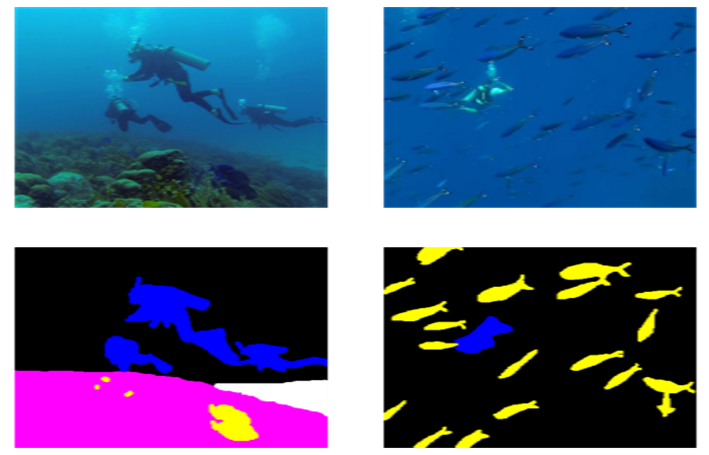

**Инстанс-сегментация** обрабатывает несколько объектов одного класса как различные объекты. Обычно инстанс-сегментация сложнее, чем семантическая сегментация. В этом случае, если на картинке несколько обьектов одного класса, то каждому обьекту будет присвоено уникальное значение пикселей и соответственно  свой цвет.

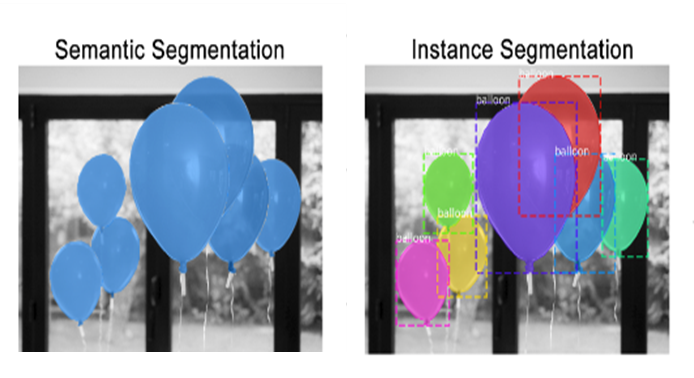

#Подготовка данных
Решение задачи семантической сегментации с помощью нейронных сетей состоит из нескольких этапов. Первый - загрузка тренировочных изображений и подготовка их для обучения нейронной сети.

Наши тренировочные данные - это набор цветных изображений RGB и соответствующих им размеченных (сегментированных) изображений. Причем, если к формату оригинальных изображений никаких особых требований не предьявляется, то сегментированные изображения не должны быть сохранены в формате JPG,так как этот формат использует сжатие с потерями, что приведет к изменению значений пикселей, которые являются метками классов. Следует использовать форматы BMP или PNG.

**Качественный датасет - одно из первых условий эффективности обучения нейронной сети, поэтому перед началом работы следует убедиться в том, что тренировочные наборы содержат одинаковое количество соответствующих друг другу изображений одинакового размера, сохраненных в нужном формате.**

Для загрузки изображений тренировочные данные должны быть помещены в рабочую среду Google Colab **/content** в  каталог с условным названием **"train"** в виде двух подкаталогов c условными названиями **"original"** и **"segment"**. Названия могут быть другими, но структура должна быть такой.  

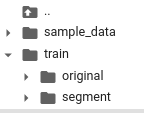

Для загрузки и подготовки изображений мы используем функцию **preprocess_data** импортированного модуля **TerraSegmentation.**

На вход функция принимает следующие параметры:

**folder**- название каталога с тренировочными данными

**subset1** - название каталога с оригинальными изображениями

**subset2**- название каталога с сегментированными изображениями

**IMG_WIDTH** - требуемая ширина изображения

**IMG_HEIGHT** - требуемая высота изображения

**num_classes** - количество классов, если оно известно. Если нет, параметр по умолчанию **-None**

Результатом работы функции будут сформированные выборки **x_data** и **y_data**, а также список значений пикселей, соответствующих каждому классу - **class_list**

Что делает функция?
1. Загружает изображения из указанных каталогов. При этом будет выдано предупреждение, если в каталоге есть файлы различного формата. Это не помешает дальнейшей загрузке, но является поводом для проверки базы данных!
2. Анализирует значения пикселей сегментированных изображений. При этом, если обнаруживаются признаки наличия "битых" пикселей (смещенных на границах обьектов в результате пересохранения), будет выдано предупреждение и сообщение, что проблема будет устранена автоматически.
3. Анализирует частоту встречаемости уникальных значений цветов (сочетаний значений пикселей RGB) в базе, выдает результат в виде перечня обнаруженных уникальных значений с процентным соотношением для каждого, фактически это список возможных классов.
4. В соответствии с полученным процентным соотношением рекомендует, какое количество классов следует оставить для обучения модели и предлагает согласиться или изменить на свое значение.
5. Преобразует значения пикселей в формате RGB в метки классов, выдает список значений цветов и соответствующих им меток
6. Формирует выборки x_data, y_data и class_list

In [ ]:
# импорт модуля
from TerraSegmentation import TerraSegmentation as seg

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# загрузка и распаковка архива с данными
#seg.gdown.download('https://storage.yandexcloud.net/aiueducation/Content/base/l14/construction_256x192.zip', None, quiet=False)
# !unzip -q '/content/drive/MyDrive/Colab Notebooks/data/train.zip' # распаковываем архив

In [ ]:
# объявление переменных
folder = 'drive/MyDrive/Colab Notebooks/data/train'
subset1 = 'original'
subset2 = 'segment'
IMG_WIDTH = 256
IMG_HEIGHT = 256

Выборка original загружена, количество изображений: 40
Выборка segment загружена, количество изображений: 40
Вероятно, в базе есть картинки с "битыми" пикселями. Это будет исправлено автоматически


Проанализировано 100 случайных изображений из базы. Результат анализа:

Количество возможных классов 14.
(0, 100, 100)   - 0.0001%
(100, 0, 0)     - 0.0001%
(255, 255, 100) - 0.0001%
(255, 0, 0)     - 0.0002%
(255, 255, 0)   - 0.0002%
(255, 100, 100) - 0.0004%
(0, 255, 100)   - 0.0009%
(100, 255, 0)   - 0.001%
(100, 100, 0)   - 0.0014%
(100, 100, 100) - 0.0016%
(100, 255, 100) - 0.002%
(0, 100, 0)     - 0.0365%
(0, 0, 0)       - 45.7639%
(0, 255, 0)     - 54.1918%

Рекомендуемое количество классов 2
Сколько классов нужно оставить для обучения модели? Подтвердите рекомендуемое или измените:2

Сформированы выборки x_data формы (40, 256, 256, 3) и y_data формы (40, 256, 256, 2).
Количество классов для обучения модели - 2.

Список классов:
(0, 255, 0)     - метка класса 0
(0, 0, 0)       - метк

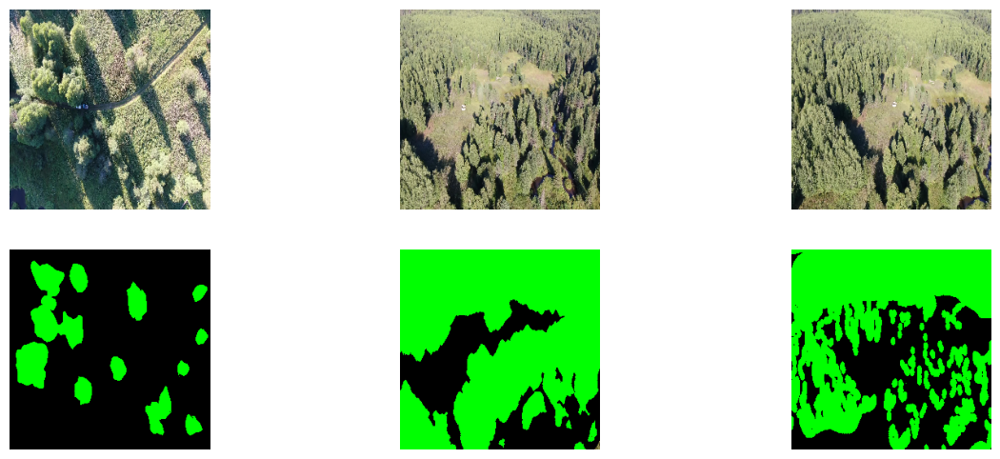


Обработка данных успешно завершена. Время работы - 43.71 c


In [ ]:
# предобработка данных
x_data, y_data, class_list = seg.preprocess_data(folder, subset1, subset2, IMG_WIDTH, IMG_HEIGHT, num_classes=2)

In [ ]:
"""
40: Количество изображений в вашем наборе данных. В данном случае40 изображений.
256: Высота каждого изображения. Каждое изображение состоит из 256 пикселей по вертикали.
256: Ширина каждого изображения. Каждое изображение состоит из 256 пикселей по горизонтали.
3: Количество каналов в каждом изображении. В данном случае 3 канала, что соответствует цветному изображению в формате RGB (красный, зеленый, синий).
"""
print(x_data.shape)
print(y_data.shape)

(40, 256, 256, 3)
(40, 256, 256, 2)


Дополнительные возможности обработки входных изображений могут быть реализованы с помощью функций обьединения цветов **get_combined_colors** и разбиения входных изображений на части **split_images**

# Функция объединения цветов.
Для реализации этой возможности необходимо знать названия классов (для принятия решения об обьединении по какому-то логическому признаку, например "лестница плюс перила" или "дверь плюс окно") и  соотнести их со списком цветов по значениям пикселей **(class_list**).

В функцию передаем сформированную на предыдущем этапе выборку **y_data**, имеющийся список цветов и списки индексов цветов (их может быть несколько), которые необходимо обьединить в один.На выходе выдается новая выборка **y_train_mix**, где индексы заменены на новые, соответствующие новому списку цветов **joint_color_list**; и этот новый список цветов

In [ ]:
# Цвета пикселов сегментированных изображений в датасете "Стройка"

trees = (0, 255, 0)             # Кроны деревьев (зеленый)
nottrees = (0, 0, 0)            # Не деревья (черный)


In [ ]:
# допустмм, мы решили объединить редко встречающиеся категории: перила с лестницей и лампы с проводами

mix_list_1 = [9,15] #объединяем категории с индексами 9,15
mix_list_2 = [12,14] #объединяем категории с индексами 12 и 14


In [ ]:
# данную функцию использовать не будем, так как вероятности классов за исключением (0, 255, 0) и (0, 0, 0) меньше одного процента
y_data_mix, joint_color_list  = seg.get_combined_colors(y_data, class_list, mix_list_1, mix_list_2)

IndexError: ignored

# Функция разделения изображений на части и формирования выборок из этих частей

Иногда из-за слишком большого разрешения исходных изображений возникают проблемы с переполнением памяти при работе с таким датасетом. Один из вариантов решения - разбить каждое изображение на 4 или 16  плиток, из которых сформировать новые выборки для обучения **x_data_spl** и **y_data_spl**, где количество примеров будет больше, но меньший размер одного изображения.

Функция **split_images** на вход принимает исходные выборки **x_data** и **y_data**, полученные на предыдущем этапе, и необходимое число частей, на которое будет разбиваться каждая картинка **(num_tiles)**

На выходе - новые выборки из разбитых уже изображений **x_data_spl** и **y_data_spl**

In [ ]:
x_data_spl,y_data_spl = seg.split_images(x_data, y_data, 4) # делим каждую картинку на 4 части

In [ ]:
# форма получившихся массивов
print(x_data_spl.shape)
print(y_data_spl.shape)

(160, 128, 128, 3)
(160, 128, 128, 2)


 Готовые выборки x_data и y_data (или их модификации с обьединением цветов или разделением) представляют собой массивы, содержащие оригинальные и сегментированные изображения, преобразованные в трехмерные тензоры, которые можно подавать на вход нейронной сети.

 Формы массивов x_data и y_data:

 (количество примеров, IMG_WIDHT, IMG_HEIGHT, количество каналов(3 для x_data и 1 для y_data))

# Создание архитектуры U_net

U-Net считается одной из стандартных архитектур сверточных нейронных сетей для задач сегментации изображений. Архитектура состоит из стягивающего пути для захвата контекста и симметричного расширяющегося пути, который позволяет осуществить точную локализацию.

По своей структуре сеть схожа с автокодировщиком, в котором
сеть сжимает данные в скрытое пространство, тем самым выявляя
основные признаки, и потом восстанавливает изображение из
скрытого пространства.



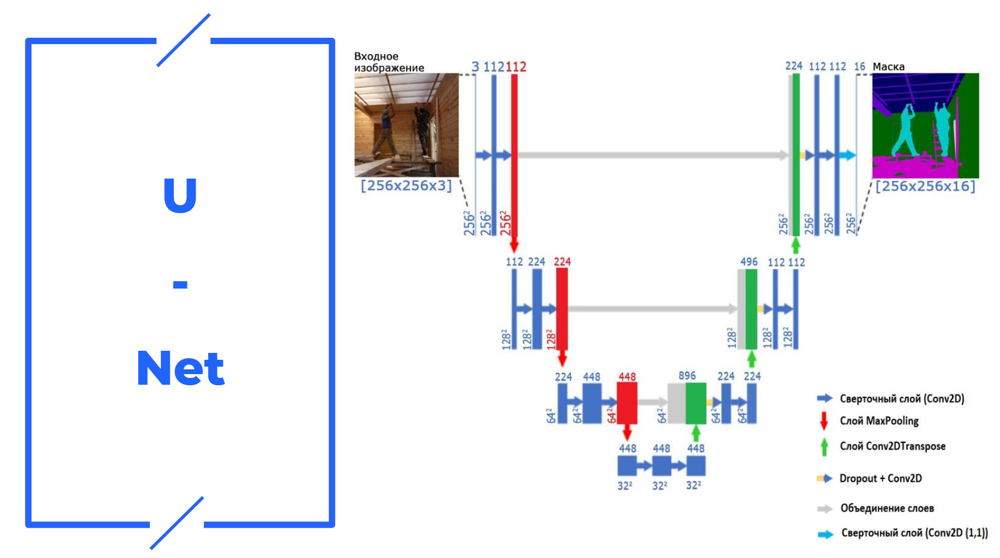

Архитектура U-net представляет собой
последовательность блоков, сначала уменьшая размерность
изображения (блоки включают Pooling-слои), а потом увеличивая,
предварительно объединив с выходами начальных блоков с
соответствующей размерностью.

Она состоит из сужающегося пути (слева) и расширяющегося пути (справа). Сужающийся путь — типичная архитектуре сверточной нейронной сети. Он состоит из повторного применения двух сверток 3×3, за которыми следуют инит ReLU и операция Max pooling для понижения разрешения.

На каждом этапе понижающей дискретизации каналы свойств удваиваются.

Каждый шаг в расширяющемся пути состоит из операции повышающей дискретизации карты свойств, за которой следуют:

свертка 2×2, которая уменьшает количество каналов свойств;
объединение с соответствующим образом обрезанной картой свойств из стягивающегося пути;
две 3×3 свертки, за которыми следует ReLU.

Функция **get_model_Unet** модуля **TerraSegmentation** строит архитектуру **Unet** с пользовательскими параметрами и сохраняет список параметров даннной модели для последующего анализа эффективности обучения. В функцию передаются полученные на этапе подготовки данных выборки **x_data, y_data** и список цветов(классов) **class_list**.

Вызов функции выглядит так:


**model, parameters = seg.get_model_Unet(x_data, y_data, class_list, parameters_dict=None)**

При вызове функции пользователю предлагается ввести необходимые значения параметров:


> Число фильтров в начальном слое сверточного блока (filters)

> Размер ядра свертки (kernel) - одно число, если предполагается одинаковая высота и ширина окна свертки; или два числа через запятую, если высота и ширина должны различаться

> Размер max_pooling (pool_size)

> Количество блоков в ветке U-net (num_layers)

> Имя модели



Допустимое максимальное количество блоков в ветке Unet определяется начальным размером входного изображения и размером Max pooling (во сколько раз будет уменьшаться картинка на каждом шаге). Поэтому при введении пользователем некорректного значения оно будет скорректировано до ближайшего возможного.

Можно заранее создать список параметров вида:

parameters = {
    'filters': 32,
    'kernel': (3,3),
    'pool_size': 2,
     'num_layers': 5,
     'class_count': 2,
      'input_shape':(256,456,3),
      'model_name': 'Unet_1'
       } и передать его в функцию

**model, parameters = seg.get_model_Unet(x_data, y_data, class_list, parameters_dict=parameters)**

На выходе получаем саму модель нейронной сети и список ее параметров.





In [ ]:
# Создание модели Unet: берем массив  и список классов после объединения цветов, словарь параметров пока не создаем
model_1, parameters_1 = seg.get_model_Unet(x_data, y_data, class_list, parameters_dict=None)

Число фильтров в начальном слое сверточного блока (filters):  16
Размер ядра свертки(kernel):                                  3
Размер max_pooling (pool_size):                               4
Количество блоков в ветке U-net (num_layers):                 3
Имя модели:                                                   


In [ ]:
print(x_data.shape)
print(y_data.shape)

(40, 256, 256, 3)
(40, 256, 256, 2)


In [ ]:
# Теперь создадим словарь параметров заранее
parameters_2 = {
    'filters': 16,
    'kernel': (3,4),
    'pool_size': 2,
     'num_layers': 3,
     'class_count': 2, # 14
      'input_shape':(256,256,3),
      'model_name': 'Unet2'
       }

In [ ]:
y_data.shape

(40, 256, 256, 2)

In [ ]:
y_data.shape

(40, 256, 256, 2)

In [ ]:
# Создаем еще одну модель, передаем параметры в виде словаря
model_2, parameters_2 = seg.get_model_Unet(x_data, y_data, class_list, parameters_dict=parameters_2)

In [ ]:
# можно посмотреть на архитектуру модели
model_2.summary()

Model: "Unet2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_15 (Conv2D)             (None, 256, 256, 16  592         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_17 (BatchN  (None, 256, 256, 16  64         ['conv2d_15[0][0]']              
 ormalization)                  )                                                             

# Обучение и оценка модели
Запустить процесс обучения и увидеть первые результаты позволяет функция  **train_eval_modelUnet**. На вход функции передаются полученные на предыдущих этапах **model, parameters, x_data, y_data, class_list**.

Вызов функции выглядит так:

**result_table =  segmet.train_eval_modelUnet(model, parameters, x_data, y_data, class_list)**

При вызове пользователю предлагается ввести параметры обучения:

> размер батча

> количество эпох

Что делает функция:
1. Формирует из массивов x_data и y_data обучающую, проверочную и тестовую выборки.
2. Запускает процесс обучения.
3. По окончании выводит график обучения.
4. Визуализирует результат в виде рандомных картинок, сегментированных по предсказанию модели параллельно с соответствующими оригинальными и сегментированными изображениями из тестовой выборки.
5. Формирует итоговую таблицу с параметрами модели и получившимся значением точности на тестовой выборке - result_table

Дополнительно с помощью функции **best_worst_result(model,x_data, y_data, class_list)** можно вывести лучшие и худшие изображения из тестовой выборки по результатам предсказания модели.

Запуск функции:

**seg.best_worst_result(model,x_data, y_data, class_list)**

После проведения ряда экспериментов с различными вариантами параметров модели можно сформировать итоговую таблицу результатов с помощью функции **final_result**, куда передаются полученные результаты обучения моделей.

Запуск функции:

**seg.final_result(result_table1, result_table2, result_table3)**





In [ ]:
model_2

Epoch 1/200
1/1 [==============================] - 1s 646ms/step - loss: 0.2650 - dice_coef: 0.8154 - val_loss: 0.4265 - val_dice_coef: 0.7369 - lr: 3.7132e-13
Epoch 2/200
1/1 [==============================] - 0s 488ms/step - loss: 0.2650 - dice_coef: 0.8154 - val_loss: 0.4260 - val_dice_coef: 0.7371 - lr: 3.7132e-13
Epoch 3/200
1/1 [==============================] - 0s 495ms/step - loss: 0.2650 - dice_coef: 0.8154 - val_loss: 0.4256 - val_dice_coef: 0.7373 - lr: 3.7132e-13
Epoch 4/200
1/1 [==============================] - 1s 515ms/step - loss: 0.2650 - dice_coef: 0.8154 - val_loss: 0.4252 - val_dice_coef: 0.7375 - lr: 3.7132e-13
Epoch 5/200
1/1 [==============================] - 0s 482ms/step - loss: 0.2650 - dice_coef: 0.8154 - val_loss: 0.4248 - val_dice_coef: 0.7377 - lr: 3.7132e-13
Epoch 6/200
1/1 [==============================] - 0s 482ms/step - loss: 0.2650 - dice_coef: 0.8154 - val_loss: 0.4244 - val_dice_coef: 0.7379 - lr: 3.7132e-13
Epoch 7/200
1/1 [=======================

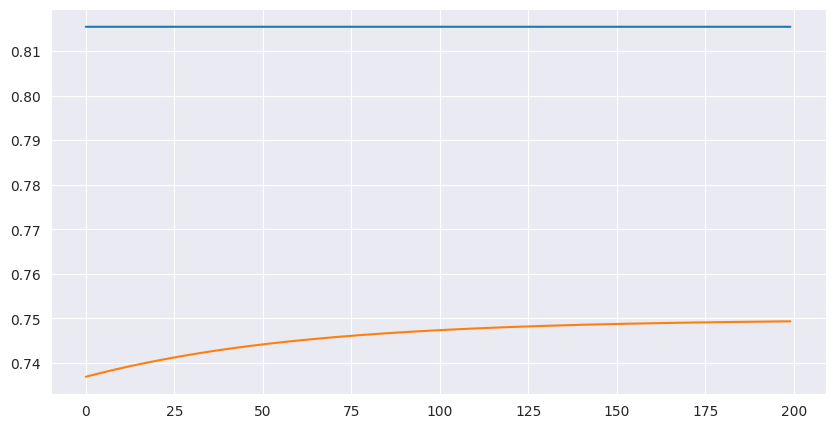

Средняя точность модели на тестовой выборке: 0.7679628729820251


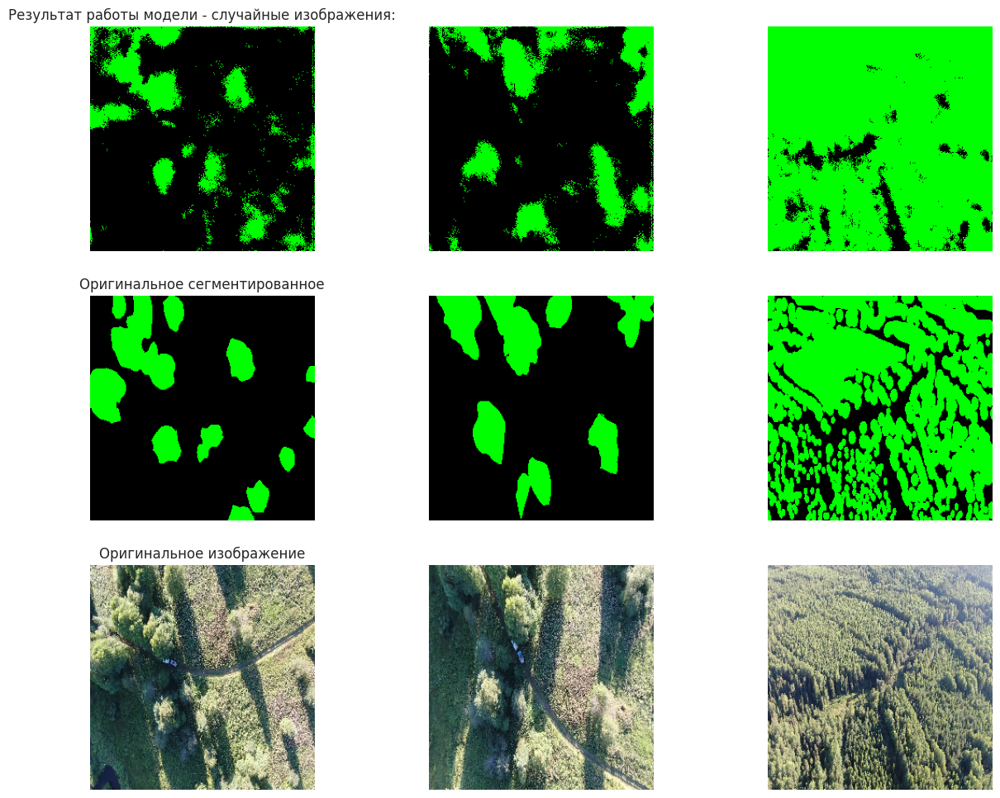

In [ ]:
# Обучение и оценка первой модели
epochs = 200
batch_size = 128
result_1 = seg.train_eval_modelUnet(model=model_2, parameters=parameters_2, x_data=x_data, y_data=y_data, batch_size=batch_size, class_list=class_list, epochs=epochs)

In [ ]:
# таблица результатов обучения с параметрами модели
result_1

,filters,kernel,pool_size,num_layers,batch_size,dice_coef
Unet2,16,"(3, 4)",2,3,128,0.767963


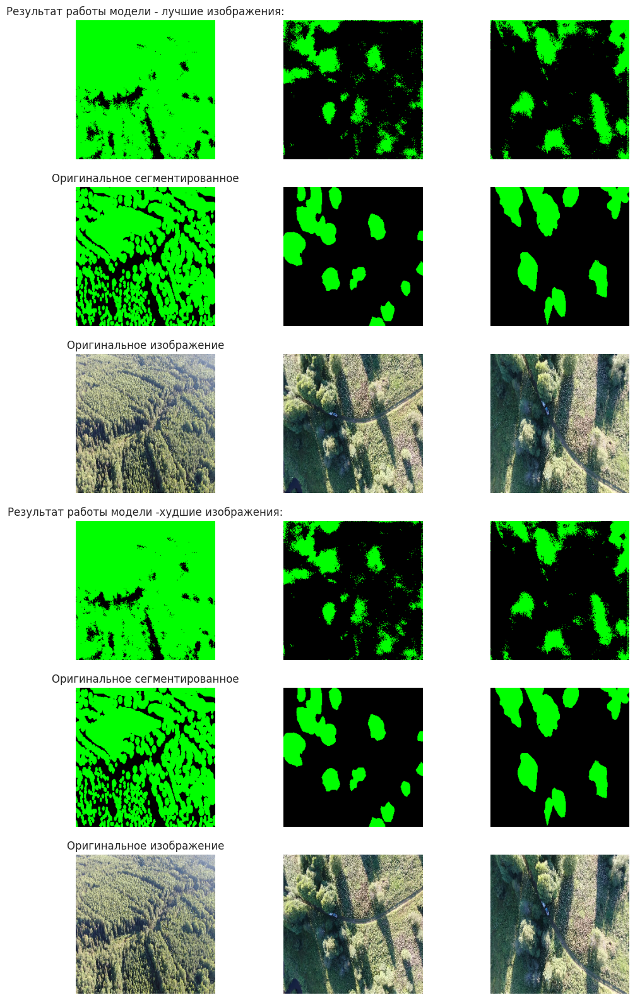

In [ ]:
# Посмотрим на лучшие и худшие результаты
seg.best_worst_result(model_2,  x_data, y_data, class_list)

In [ ]:

# Теперь создадим словарь параметров заранее
parameters_3 ={
    'filters': 10,
    'kernel': (4,6),
    'pool_size': 4,
     'num_layers': 4,
     'class_count': 2, # 14
      'input_shape':(256,256,3),
      'model_name': 'Unet3'
       }

In [ ]:
model_3, parameters_3 = seg.get_model_Unet(x_data, y_data, class_list, parameters_dict=parameters_3)

Epoch 1/200
1/1 [==============================] - 0s 374ms/step - loss: 0.3133 - dice_coef: 0.7797 - val_loss: 0.9535 - val_dice_coef: 0.6099 - lr: 6.1409e-11
Epoch 2/200
1/1 [==============================] - 0s 255ms/step - loss: 0.3133 - dice_coef: 0.7797 - val_loss: 0.9543 - val_dice_coef: 0.6100 - lr: 6.1409e-11
Epoch 3/200
1/1 [==============================] - 0s 250ms/step - loss: 0.3133 - dice_coef: 0.7797 - val_loss: 0.9551 - val_dice_coef: 0.6101 - lr: 6.1409e-11
Epoch 4/200
1/1 [==============================] - 0s 250ms/step - loss: 0.3133 - dice_coef: 0.7797 - val_loss: 0.9559 - val_dice_coef: 0.6103 - lr: 6.1409e-11
Epoch 5/200
1/1 [==============================] - 0s 245ms/step - loss: 0.3133 - dice_coef: 0.7797 - val_loss: 0.9568 - val_dice_coef: 0.6104 - lr: 6.1409e-11
Epoch 6/200
1/1 [==============================] - 0s 252ms/step - loss: 0.3133 - dice_coef: 0.7797 - val_loss: 0.9575 - val_dice_coef: 0.6105 - lr: 6.1409e-11
Epoch 7/200
1/1 [=======================

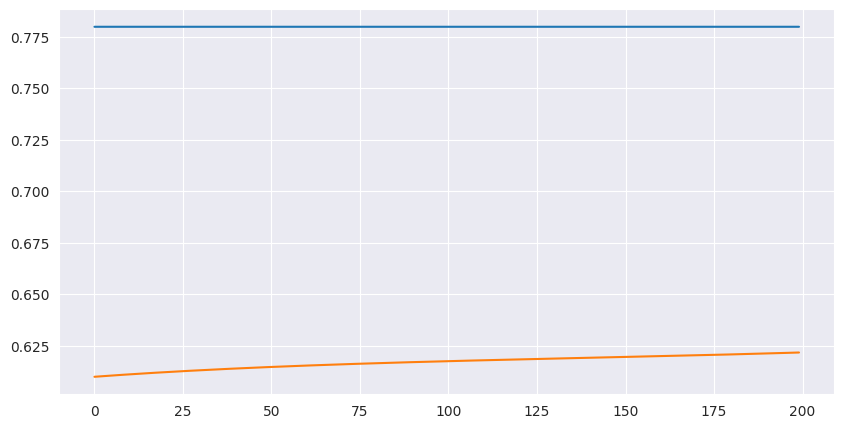

Средняя точность модели на тестовой выборке: 0.5544701814651489


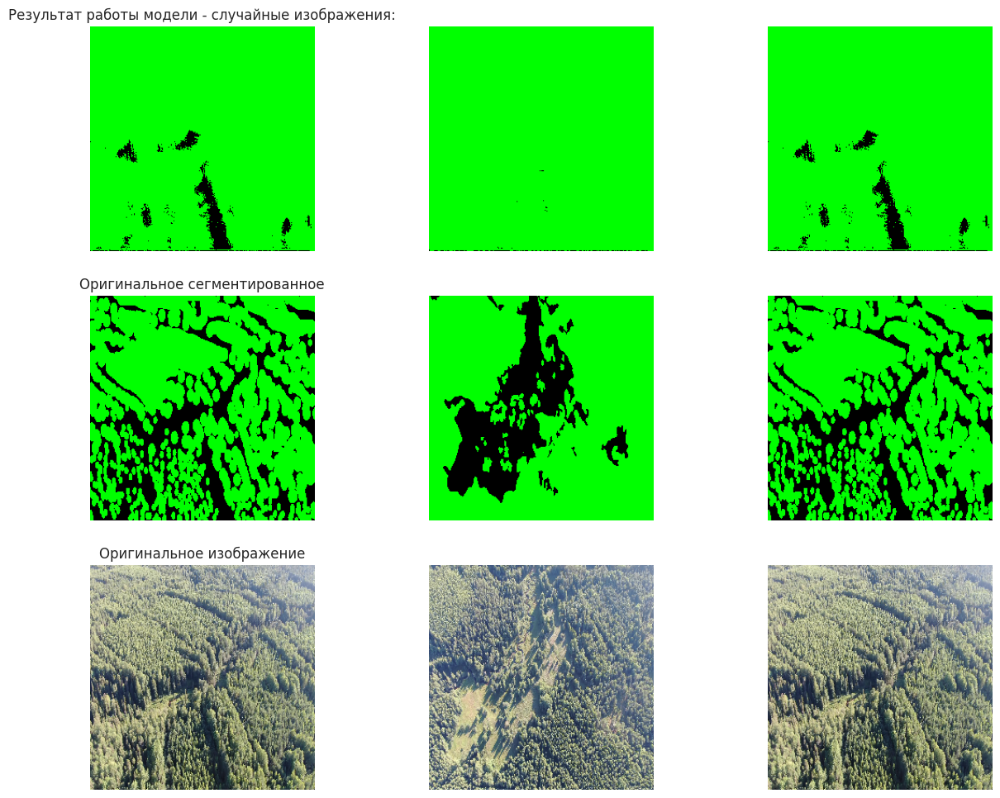

In [ ]:
# обучаем вторую модель
# model=model_2, parameters=parameters_1, x_data=x_data, y_data=y_data_mix, batch_size=batch_size, class_list=joint_color_list, epochs=epochs
result_2 = seg.train_eval_modelUnet(model=model_3, parameters=parameters_3, x_data=x_data, y_data=y_data,  batch_size=batch_size, class_list=class_list, epochs=epochs)

In [ ]:
result_2

,filters,kernel,pool_size,num_layers,batch_size,dice_coef
Unet3,10,"(4, 6)",4,4,128,0.55447


In [ ]:
# Итоговая сравнительная таблица по двум моделям
seg.final_result(result_1, result_2)

Итоговая таблица результатов


,filters,kernel,pool_size,num_layers,batch_size,dice_coef
Unet2,16,"(3, 4)",2,3,128,0.767963
Unet3,10,"(4, 6)",4,4,128,0.554470


# Создание архитектуры, обучение и оценка PSPnet

Модель PSPnet оптимизирована для глубокого изучения изображения. Сначала изображение передается во входной сверточный блок для получения карты признаков (это может быть классическая сверточная нейронная сеть, например ResNet). Далее карту признаков с помощю слоев пулинга с разным размером ядра сужают до нескольких разных масштабов. Затем применяются свертки, после чего все карты признаков подвергаются развертыванию слоями апсемплинга до общего размера матриц, и соединяются вместе. Полученный результат обьединяется с результатами выходов сверточных слоев начального блока модели. Наконец, выходной сверточный блок используется для получения окончательного сегментированного изображения.

В PSPnet более мелкие объекты хорошо захватываются за счет объединения объектов в высоком разрешении, а более крупные объекты фиксируются за счет объединения объектов меньшего разрешения.

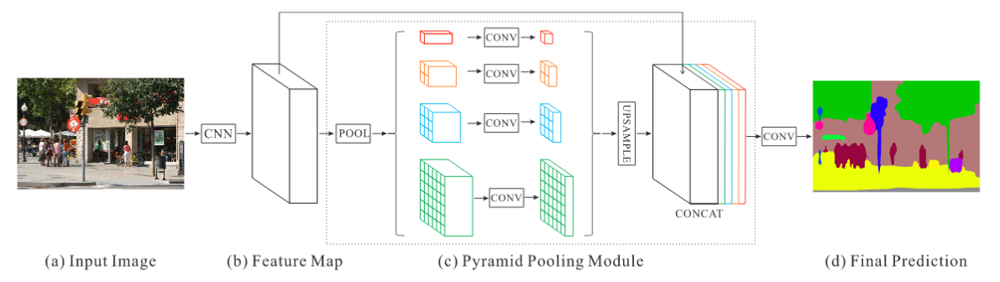

Для создания архитектуры, обучения и оценки PSPnet используются функции **get_modelPSP(x_data, y_data, class_list,  parameters_dict=None)** и **train_eval_modelPSP(model,parameters, x_data, y_data, class_list)**

Словарь также можно создать заранее и передать в функцию получения модели.

parameters_dict =

{
    'filters': 16,
    'kernel': (5,7),
    'pool_number': 4,
     'conv_number': 3,
     'class_count': 7,
      'input_shape':(192,256,3),
      'model_name': 'PSP1'
       }


Работа функций аналогична соответствующим функциям для Unet, за исключением передаваемых для построения модели параметров:


> Число фильтров в каждом слое сверточного блока (filters)

> Размер ядра свертки (kernel)

> Количество блоков maxPooling (pool_number)

> Количество сверточных блоков (conv_number)

Вывести лучшие и худшие результаты, а также финальную таблицу результатов экспериментов можно с помощью уже описанных функций **best_worst_result** и **final_result**









In [ ]:
# Загрузка и распаковка архива
# seg.gdown.download('https://storage.yandexcloud.net/aiueducation/Content/base/l14/airplane_456x256.zip', None, quiet=False)
# !unzip -q -d '/content/train2' '/content/airplane_456x256.zip'
# seg.os.replace('/content/train2/train/original', '/content/train2/original')
# seg.os.replace('/content/train2/train/segment', '/content/train2/segment')

Downloading...
From: https://storage.yandexcloud.net/aiueducation/Content/base/l14/airplane_456x256.zip
To: /content/airplane_456x256.zip
100%|██████████| 102M/102M [00:05<00:00, 17.4MB/s]


In [ ]:
# объявление переменных
folder = 'drive/MyDrive/Colab Notebooks/data/train2'
subset1 = 'original'
subset2 = 'segment'
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
# объявление переменных
#folder = 'train2'
#subset1 = 'original'
#subset2 = 'segment'
#IMG_WIDTH = 456
#IMG_HEIGHT = 256

Выборка original загружена, количество изображений: 40
Выборка segment загружена, количество изображений: 40
Вероятно, в базе есть картинки с "битыми" пикселями. Это будет исправлено автоматически


Проанализировано 100 случайных изображений из базы. Результат анализа:

Количество возможных классов 14.
(0, 100, 100)   - 0.0001%
(100, 0, 0)     - 0.0001%
(255, 0, 0)     - 0.0001%
(255, 255, 0)   - 0.0002%
(255, 255, 100) - 0.0002%
(255, 100, 100) - 0.0005%
(0, 255, 100)   - 0.0012%
(100, 255, 0)   - 0.0013%
(100, 100, 0)   - 0.0015%
(100, 100, 100) - 0.0023%
(100, 255, 100) - 0.0024%
(0, 100, 0)     - 0.0434%
(0, 0, 0)       - 46.2893%
(0, 255, 0)     - 53.6574%

Рекомендуемое количество классов 2
Сколько классов нужно оставить для обучения модели? Подтвердите рекомендуемое или измените:2

Сформированы выборки x_data формы (40, 256, 256, 3) и y_data формы (40, 256, 256, 2).
Количество классов для обучения модели - 2.

Список классов:
(0, 255, 0)     - метка класса 0
(0, 0, 0)       - ме

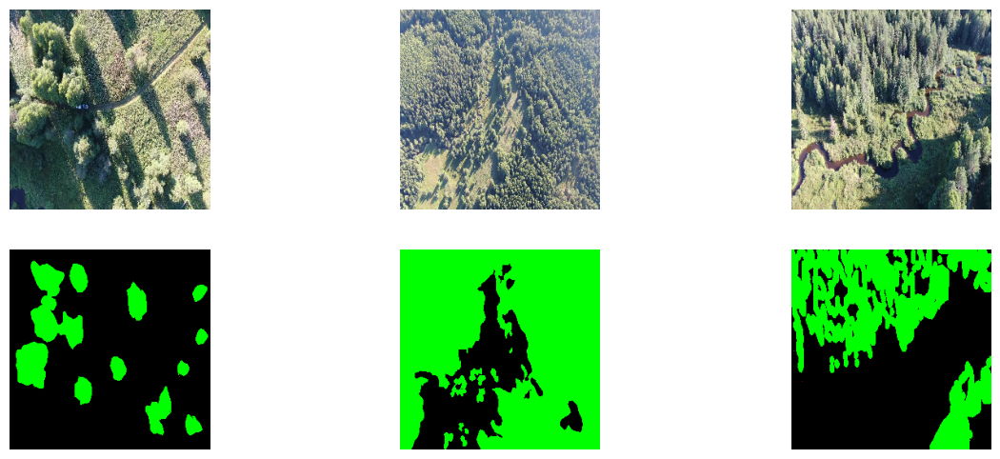


Обработка данных успешно завершена. Время работы - 89.81 c


In [ ]:
# Загрузка и подготовка данных
x_data, y_data, class_list = seg.preprocess_data(folder, subset1, subset2, IMG_WIDTH, IMG_HEIGHT, num_classes=2)

In [ ]:
# Создание модели PSPnet
model_3, parameters_3 = seg.get_model_PSP(x_data, y_data, class_list, parameters_dict=None)

Число фильтров в каждом слое сверточного блока (filters):     16
Размер ядра свертки(kernel):                                  5
Количество блоков maxPooling (pool_number):                   4
Количество сверточных блоков (conv_number):                   4
Имя модели:                                                   PSP3


Epoch 1/200
1/1 [==============================] - 1s 707ms/step - loss: 0.3695 - dice_coef: 0.7554 - val_loss: 0.3688 - val_dice_coef: 0.7615 - lr: 2.3158e-23
Epoch 2/200
1/1 [==============================] - 1s 647ms/step - loss: 0.3695 - dice_coef: 0.7554 - val_loss: 0.3688 - val_dice_coef: 0.7615 - lr: 2.3158e-23
Epoch 3/200
1/1 [==============================] - 1s 648ms/step - loss: 0.3695 - dice_coef: 0.7554 - val_loss: 0.3688 - val_dice_coef: 0.7615 - lr: 2.3158e-23
Epoch 4/200
1/1 [==============================] - 1s 649ms/step - loss: 0.3695 - dice_coef: 0.7554 - val_loss: 0.3688 - val_dice_coef: 0.7615 - lr: 2.3158e-23
Epoch 5/200
1/1 [==============================] - 1s 647ms/step - loss: 0.3695 - dice_coef: 0.7554 - val_loss: 0.3688 - val_dice_coef: 0.7615 - lr: 2.3158e-23
Epoch 6/200
1/1 [==============================] - 1s 655ms/step - loss: 0.3695 - dice_coef: 0.7554 - val_loss: 0.3689 - val_dice_coef: 0.7615 - lr: 2.3158e-23
Epoch 7/200
1/1 [=======================

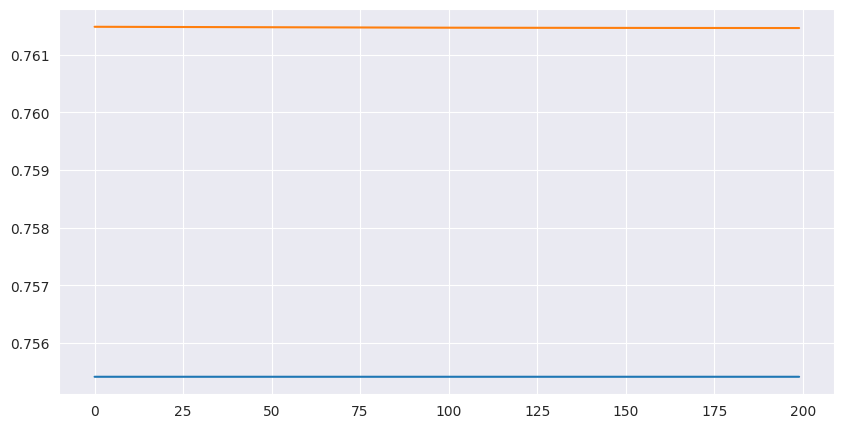

Средняя точность модели на тестовой выборке: 0.762890100479126


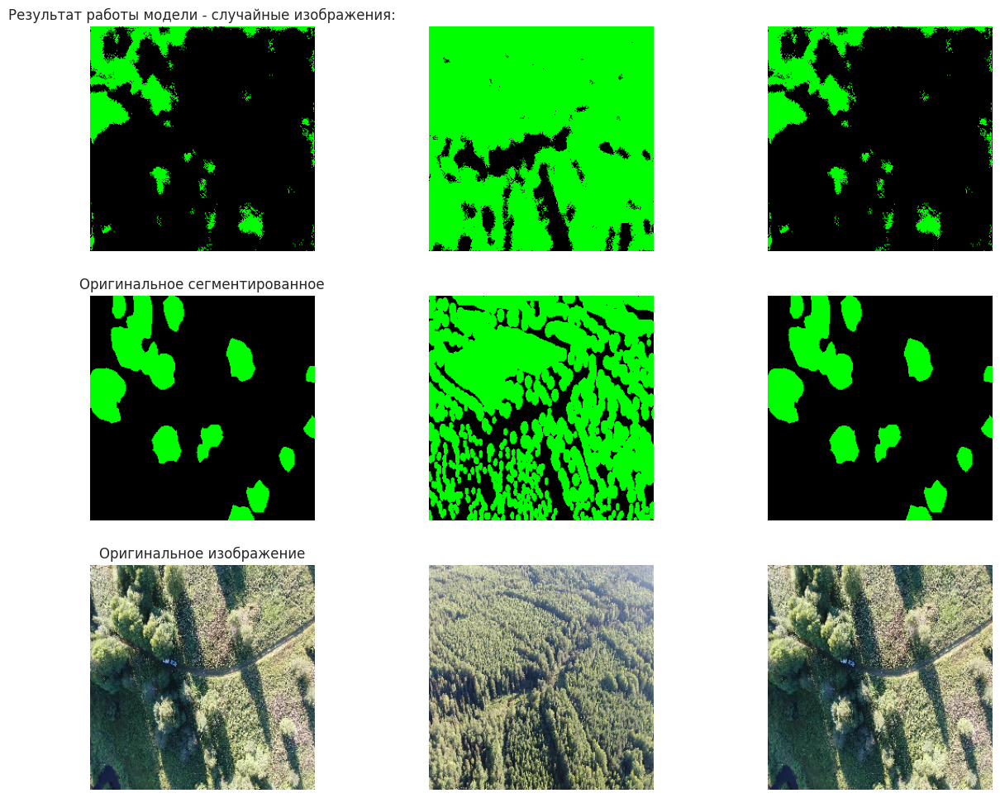

In [ ]:
# обучение и оценка модели
#result_3 = seg.train_eval_modelPSP(model=model_3, parameters=parameters_3 ,x_data=x_data, y_data=y_data, batch_size = 64, epochs = 100, class_list= 2)
result_3 = seg.train_eval_modelPSP(model_3, parameters_3, x_data, y_data,batch_size, epochs, class_list)

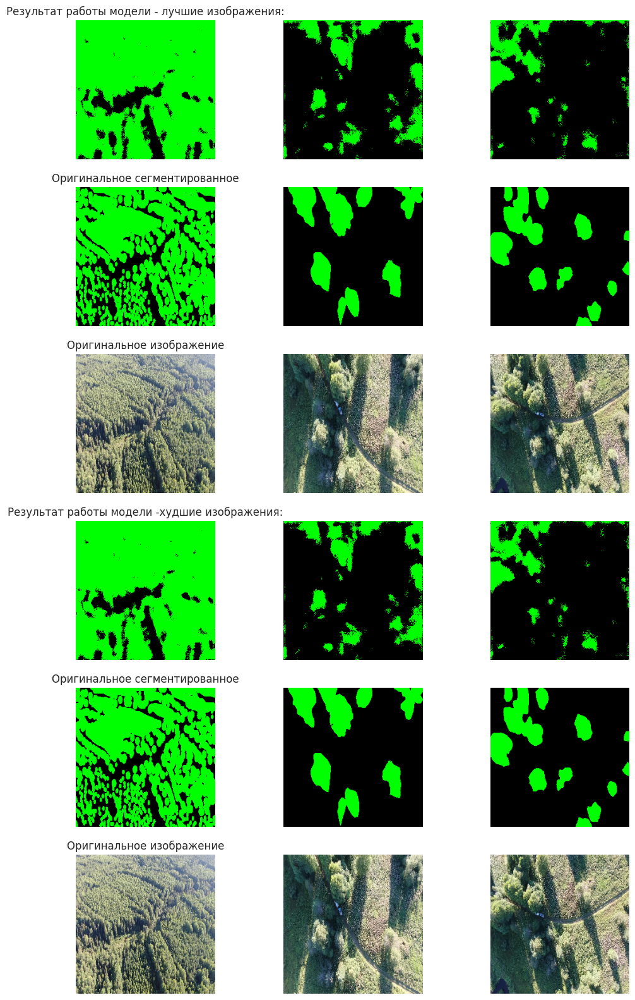

In [ ]:
seg.best_worst_result(model_3,x_data, y_data, class_list)

In [ ]:
# Результаты обучения
result_3

,filters,kernel,pool_number,conv_number,batch_size,dice_coef
PSP3,16,"(5, 5)",4,4,128,0.76289


In [ ]:
# Словарь параметров для модели PSPnet
parameters_4 = {
    'filters': 32,
    'kernel': (3,4),
    'pool_number': 3,
     'conv_number': 3,
     'class_count': 2,
      'input_shape':(256,256,3),
      'model_name': 'PSP4'
       }

In [ ]:
# Создание модели PSPnet с заранее созданным словарем параметров
model_4, parameters_4 = seg.get_model_PSP(x_data, y_data, class_list, parameters_4)

Epoch 1/200
1/1 [==============================] - 1s 1s/step - loss: 0.5879 - dice_coef: 0.6240 - val_loss: 0.5738 - val_dice_coef: 0.5972 - lr: 2.1768e-07
Epoch 2/200
1/1 [==============================] - 1s 1s/step - loss: 0.5878 - dice_coef: 0.6240 - val_loss: 0.5733 - val_dice_coef: 0.5976 - lr: 2.1768e-07
Epoch 3/200
1/1 [==============================] - 1s 1s/step - loss: 0.5878 - dice_coef: 0.6240 - val_loss: 0.5729 - val_dice_coef: 0.5981 - lr: 2.1768e-07
Epoch 4/200
1/1 [==============================] - 1s 1s/step - loss: 0.5878 - dice_coef: 0.6240 - val_loss: 0.5724 - val_dice_coef: 0.5985 - lr: 2.1768e-07
Epoch 5/200
1/1 [==============================] - 1s 1s/step - loss: 0.5878 - dice_coef: 0.6240 - val_loss: 0.5720 - val_dice_coef: 0.5990 - lr: 2.1768e-07
Epoch 6/200
1/1 [==============================] - 1s 1s/step - loss: 0.5878 - dice_coef: 0.6240 - val_loss: 0.5715 - val_dice_coef: 0.5994 - lr: 2.1768e-07
Epoch 7/200
1/1 [==============================] - 1s 1s/s

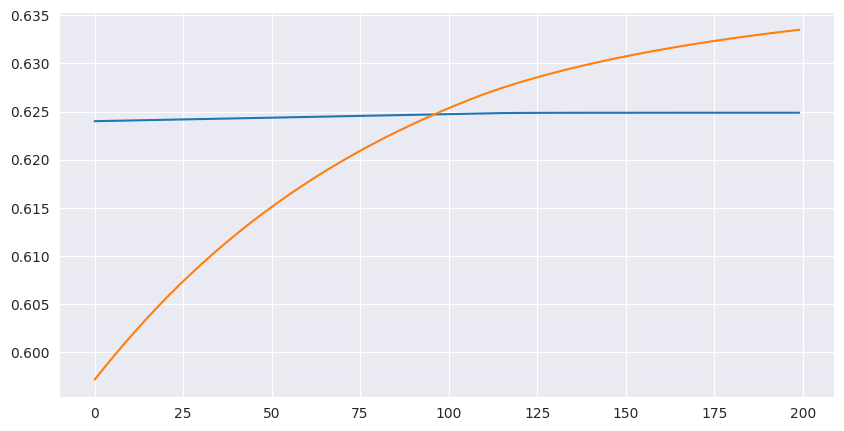

Средняя точность модели на тестовой выборке: 0.6305180191993713


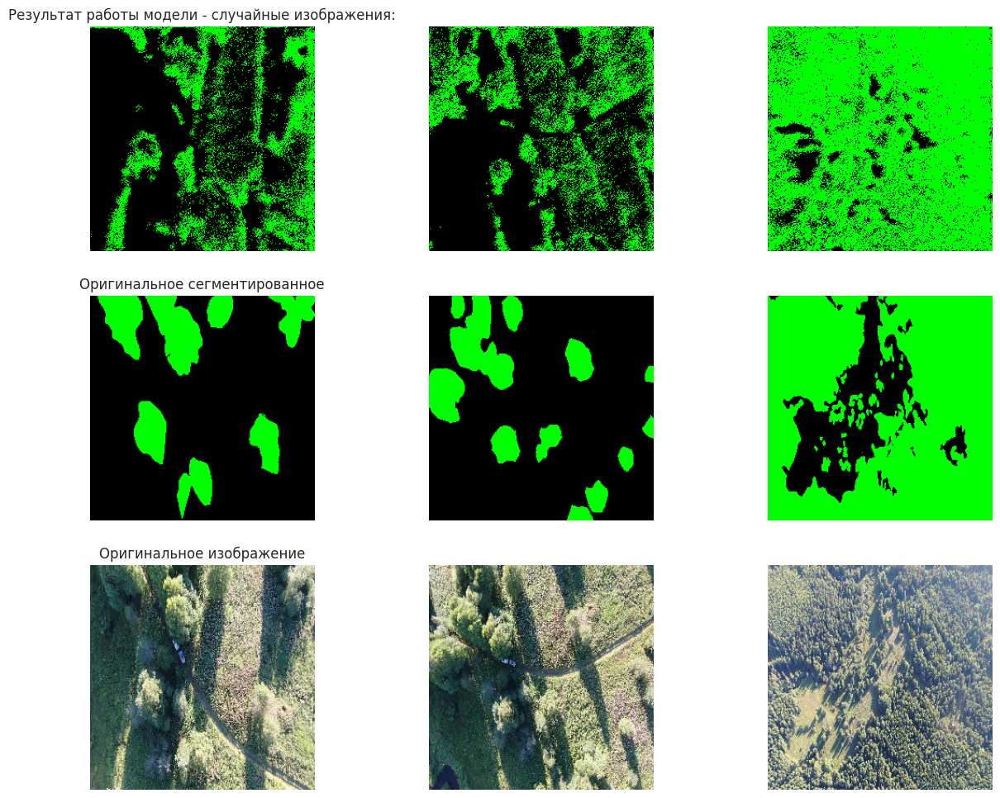

In [ ]:
# обучение и оценка модели
result_4 = seg.train_eval_modelPSP(model_4, parameters_4, x_data, y_data, batch_size, epochs, class_list)

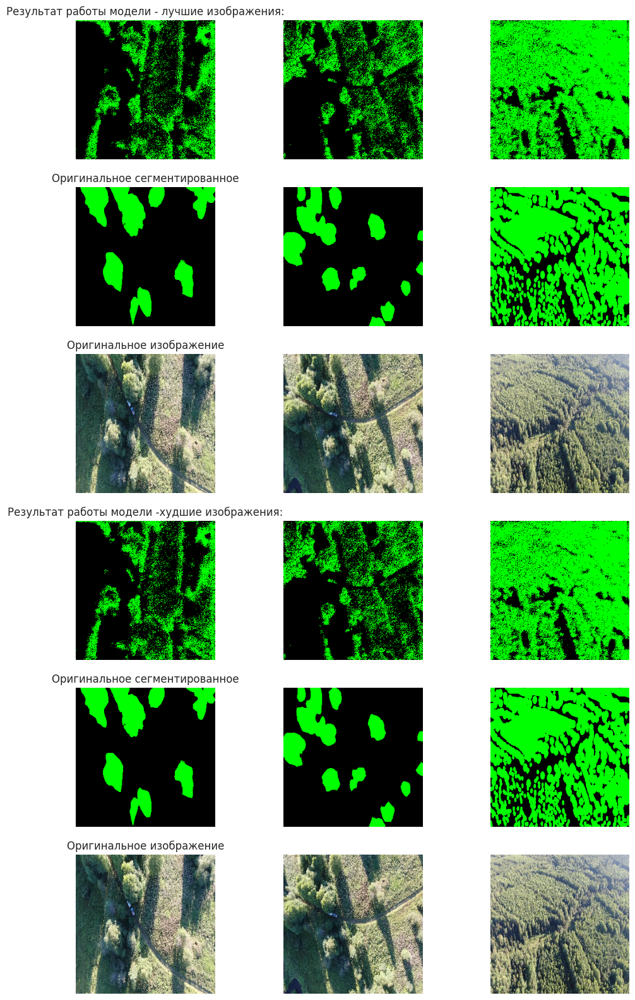

In [ ]:
seg.best_worst_result(model_4, x_data, y_data, class_list)

In [ ]:
# Результат
result_4

,filters,kernel,pool_number,conv_number,batch_size,dice_coef
PSP4,32,"(3, 4)",3,3,128,0.630518


In [ ]:
# Результат обучения моделей PSPnet
seg.final_result(result_3, result_4)


Итоговая таблица результатов


,filters,kernel,pool_number,conv_number,batch_size,dice_coef
PSP3,16,"(5, 5)",4,4,128,0.762890
PSP4,32,"(3, 4)",3,3,128,0.630518


In [ ]:
# Результат обучения моделей
seg.final_result(result_1,result_2,result_3, result_4)

Итоговая таблица результатов


,filters,kernel,pool_size,num_layers,batch_size,dice_coef,pool_number,conv_number
Unet2,16,"(3, 4)",2,3,128,0.767963,0,0
Unet3,10,"(4, 6)",4,4,128,0.554470,0,0
PSP3,16,"(5, 5)",0,0,128,0.762890,4,4
PSP4,32,"(3, 4)",0,0,128,0.630518,3,3
